Hola Vicente, te presento el notebook para el proyecto final

Hola Benjamín, muchas gracias por el notebook para el proyecto final.

In [ ]:
# Librerías
import numpy as np
import scipy
from time import time
import pandas as pd
from matplotlib.animation import FuncAnimation

import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import rc
rc('animation', html='jshtml')

grafica = False #si se desea graficar, colocar True

Trabajaremos en el modelo SKT, que describe especies animales en competencia que tienen difusión con repulsión  local. En el caso de $2$ especies las ecuaciones son:
$$
\left\{\begin{matrix}
\partial_{t}u - \Delta(d_{1}u + a_{11}u^{2}+a_{12}uv) = u(r_{1}-s_{11}u-s_{12}v)\\ 
\partial_{t}v - \Delta(d_{2}v + a_{21}uv + a_{22}v^{2}) = v(r_{2}-s_{21}u-s_{22}v)
\end{matrix}\right.
$$
donde $u$ y $v$ son densidades de las dos especies y $d_i,r_i,a_{ij}, s_{ij}$ son números reales no negativos. En conjunto con las condiciones iniciales y condiciones de borde, este sistema ofrece un modelo de propagación de dos especies que interactuan entre sí y que influyen mutuamente en cuán propensas son dispersarse (a través de los coeficientes de difusión cruzada $a_{ij}$). A su vez, los coeficientes $d_{i}$ son de difusión natural, los $r_{i}$ los de reproducción y los $s_{ij}$ de competencia.
Por temas de simplicidad de las soluciones consideraremos el sistema conservativo de SKT, que no posee el término de auto-difusión, como sigue:

$$
\left\{\begin{matrix}
\partial_{t}u - \Delta(d_{1}u + a_{12}uv) = 0\\ 
\partial_{t}v - \Delta(d_{2}v + a_{21}uv) = 0
\end{matrix}\right.
$$




Ahora vamos a considerar un modelo estocástico discreto de $M \in \mathbb{N}$ lugares donde la población está distribuida, donde el lugar $1$ es vecino del $2$ y del $M$.De esta forma, proponemos un toro unidimensional en $\mathbb{R}_{+}$.
El proceso que consideraremos es una cadena de Markov continua $(U(t),V(t))_{t \geq 0}$ tomando valores en $\mathbb{N}^{M} \times \mathbb{N}^{M}$. Cada coordenada es un vector de largo $M$, donde cada $U_{i}(t)$ es el número de individuos de la especie $u$ al tiempo $t$ en el lugar $i \in \{1,...,M \}$. Análogo en el caso de $V(t)$.
Además, cada individuo de cada especie sigue un paseo aleatorio y sus probabilidades de salto aumentan de manera lineal con respecto al número de individuos de la otra especie. La dinámica de las tasas de salto es la siguiente, para todo vector $(u,v) \in \mathbb{N}^{M} \times \mathbb{N}^{M}$ las transiciones son:
$$
u \mapsto u + (e_{i+\theta}-e_{i})
$$
A tasa: $ 2u_{i}(d_{1}+a_{12}v_{i})$
$$ 
v \mapsto v + (e_{i+\theta}-e_{i}),
$$
A tasa: $2v_{i}(d_{2}+a_{21}u_{i})$

Donde $(e_j)_{1\leq j \leq M}$ es la base canónica de $\mathbb{R}^{M}$. Además, consideramos $e_{0} = e_{M}, e_{M+1}=e_{1}$ y $\theta \in \{-1,1 \}$ con probabilidad simétrica.

Un primer resultado de estabilidad de las soluciones débiles para el sistema SKT conservativo está dado por el teorema que expondremos a continuación. Antes de eso, para medir la distancia entre dos soluciones en el intervalo temporal $[0,T]$, introducimos la siguiente norma y funciones afines respectivamente:
$$
||| . |||_{T} := (\hspace{0.1cm} ||.||^{2}_{L^{\infty}([0,T];H^{-1}(\mathbb{T}^{d}))} + ||.||^{2}_{L^{2}(Q_{T})} \hspace{0.1cm} )^{1/2}
$$
$$
\mu_{i}:\mathbb{R} \longrightarrow \mathbb{R} \hspace{0.1cm}, \hspace{0.1cm} i \in \{1,2 \} 
$$
$$
\mu_{i}(x) := d_{i} + a_{ij}x
$$


$
\mathit{Teorema}
$
Sea $T>0$ y considerar un par $(u,v) \in L^{\infty}(Q_{T})^{2}$ y $(\bar{u},\bar{v}) \in L^{\infty}(Q_{T})^{2} $ de soluciones débiles acotadas no negativas del sistema SKT conservativo, cuyas condiciones iniciales están dadas por $(u_{0},v_{0}), (\bar{u}_{0},\bar{v}_{0}) \in L^{\infty}(\mathbb{T}^{d})^{2}$ respectivamente. Si además tenemos la siguiente condición:
$$
||\bar{u}||_{L^{\infty}(Q_{T})} ||\bar{v}||_{L^{\infty}(Q_{T})} < \frac{d_{1}d_{2}}{a_{12}a_{21}}
$$
, entonces:
$$
||| u - \bar{u} |||_{T}^{2} + ||| v - \bar{v} |||_{T}^{2} \lesssim ||u_{0} - \bar{u}_{0}||_{H^{-1}(\mathbb{T}^{d})}^{2} + ||v_{0} - \bar{v}_{0}||_{H^{-1}(\mathbb{T}^{d})}^{2}
$$
$$
+ T \left([u_{0} - \bar{u}_{0}]_{\mathbb{T}^{d}}^{2} || \mu_{1}(v_{0})||_{L^{1}(\mathbb{T}^{d})} + [v_{0}- \bar{v}_{0}]_{\mathbb{T}^{d}}^{2} || \mu_{2}(u_{0})||_{L^{1}(\mathbb{T}^{d})} \right)
$$

Donde la constante depende de $a_{ij},d_{i}, ||\bar{u}||_{L^{\infty}(Q_{T})}, || \bar{v}||_{L^{\infty}(Q_{T})}$.
En particular, si una solución acotada no negativa satisface la condición del teorema anterior, no hay otra solución acotada no negativa que comparta la misma condición inicial. 

In [2]:
# recibe w especie (0 si es u, 1 si es v)
# recibe i un sitio en {0,..., M-1}
# recibe u0, v0 vectores de largo M (estado inicial del salto)
# recibe dirección de paso (1 si avanza, -1 si retrocede)
def tasas(w, i, u0, v0, a, d):
    M = len(u0)
    if w == 0: #u se mueve
        return 2*u0[i]*(d[0] + a[0]*v0[i])
    elif w == 1: #v se mueve
        return 2*v0[i]*(d[1] + a[1]*u0[i])
    return 0

In [3]:
# q_i donde i es un estado (u,v)
# q_i corresponde a la suma (sobre los vecinos) de las tasas de saltar desde i a cada vecino

def tasaTotal(u0, v0, a, d):
    M = len(u0)
    S = 0
    #hay que sumar sobre la especie que se mueve:
    for w in range(2):
        #hay que sumar sobre los sitios
        for i in range(M):
            S += 2*tasas(w,i,u0, v0, a, d)
    return S

In [4]:
# la fila (u0,v0)-ésima de la matriz de saltos
# 
def mSaltos(u0, v0, a, d): #i
    M = len(u0)
    R = np.zeros((2,M,2)) #R[j] es la probabilidad de saltar desde (u0,v0) a j = (w, i, theta)
    #R[w,i,0 o 1]
    q = tasaTotal(u0, v0, a, d)

    if (q != 0):
        for w in range(2): #especie
            for i in range(M): #lugar
                for theta in range(2): #dirección
                    R[w,i,theta] = tasas(w,i, u0, v0, a, d) / q

    return R

#estoy en u0, v0
#quiero saltar a u, v
#ocurre con probabilidad R[u,v]


#un vecino de (u0, v0)

In [5]:
#dado u0 y v0 y coef a, d, retorna uf, vf tras 1 salto
def salto(u0, v0, a, d):
    M = len(u0)
    U = np.random.random()
    p = 0
    R=  mSaltos(u0, v0, a, d)
    uf = u0.copy()
    vf = v0.copy()
    for w in range(2): #especie
        for i in range(M): #lugar
            for theta in range(2): #dirección
                p += R[w,i,theta]
                if p > U:
                    if w == 0: #el cambio es en u
                        uf[i] += -1
                        if theta == 0: #hacia atrás
                            uf[(i-1) % M] += 1
                            return uf, vf 
                        elif theta == 1: #hacia adelante
                            uf[(i+1) % M] += 1
                            return uf, vf
                    elif w == 1: #el cambio es en v
                        vf[i] += -1
                        if theta == 0: #hacia atrás
                            vf[(i-1) % M] += 1
                            return uf, vf 
                        elif theta == 1: #hacia adelante
                            vf[(i+1) % M] += 1
                            return uf, vf
    print("ERROR")

In [6]:
#EJEMPLO DE LABORATORIO
d = [1/2, 1/4]
a = [1.5,2]

u1 = np.multiply([1,3,5,2], 25)
v1 = np.multiply([0,9,2,5], 25)
u2 = np.multiply([1,3,5,2,9,0,0,1,7,2], 25)
v2 = np.multiply([0,9,2,5,1,10,10,9,3,8], 25)

print(tasas(0,1,u1,v1, a, d))
print(salto(u1, v1, a, d))

50700.0
(array([ 25,  74, 126,  50]), array([  0, 225,  50, 125]))


Funcion markov chain pero con listas de python

In [7]:
# MARKOV CHAIN

def MarkovChain(u0, v0, T):
    x0  = [u0, v0]
    tsaltos = [0]
    X = [x0]
    t = 0
    while t < T:
        x = X[-1]
        u,v = x

        relojexp = np.random.exponential(1/tasaTotal(u,v))
        t+= relojexp
        tsaltos.append(t)

        uf, vf = salto(u,v)
        xf = [uf,vf]
        X.append(xf)
        
    return X, tsaltos

In [8]:
# MARKOV CHAIN (con array)

def MarkovChain2(u0, v0, T, a, d, semilla = 0):
    inf = 10**7
    M = len(u0)
    x0  = [u0, v0]
    tsaltos = np.zeros((inf))
    X = np.zeros((2,M,inf))
    X[0,:,0] = u0 #!!!!! u0 es vector de largo M
    X[1,:,0] = v0

    t = 0
    nsaltos = 0
    np.random.seed(semilla)
    while nsaltos < inf and tsaltos[nsaltos] < T:
        u = X[0,:,nsaltos]
        v = X[1,:,nsaltos]

        relojexp = np.random.exponential(1/tasaTotal(u,v, a, d))
        tsaltos[nsaltos+1] = tsaltos[nsaltos] + relojexp
        nsaltos += 1 #!#

        uf, vf = salto(u,v,a,d)
        X[0,:,nsaltos] = uf
        X[1,:,nsaltos] = vf



    return X, tsaltos, nsaltos

In [9]:
X, T, n = MarkovChain2(u1, v1, 2, a, d)
#print(X, T)


In [10]:
XX = X[:,:, 0:n]
TT = T[0:n]

In [11]:
if grafica:
    for i in range(len(u1)):
        plt.plot(TT, XX[0, i], label = "sitio "+str(i))
        plt.title("Población u")

        plt.legend()
    plt.show()


In [12]:
if grafica:
    for i in range(len(u1)):
        plt.plot(TT, XX[1,i], label = "sitio "+str(i))
        plt.title("Población v de estado inicial " + str(v1) )
        plt.legend()
        
    plt.show()

A continuación, animaremos sobre el tiempo el histograma de población en cada sitio.

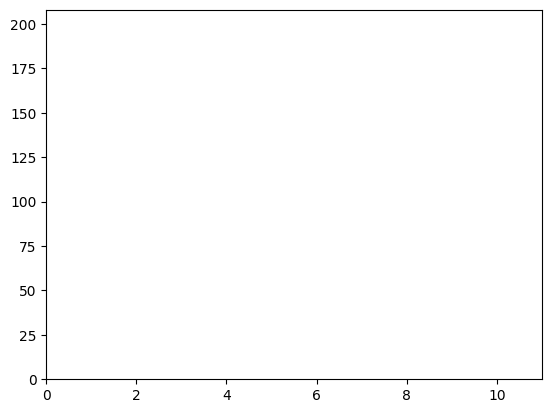

In [13]:
u2 = np.multiply([1,3,5,2,9,0,0,1,7,2], 10)
v2 = np.multiply([0,9,2,5,1,10,10,9,3,8], 10)

X, T, n = MarkovChain2(u2, v2, 1, a, d)
XX = X[:,:, 0:n]
TT = T[0:n]

M = len(u2)
sitios = np.array(range(M)) + 1


U = XX[0, :, :]
V = XX[1, :, :]


MAX= np.max(XX)+1
fig3, ax3 = plt.subplots()
ax3.set_xlim(0,M+1)
ax3.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

scale = 25

def framebar(i):
    ax3.clear()
    ax3.set_xlim(0,M+1)
    ax3.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax3.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax3.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax3.set_title("Distribución de población en sitios ("+str(scale*i)+"/"+str(n)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig3


#ani.save("animation.gif", writer='Pillow', fps=30)
#plt.plot()


In [14]:
ani = FuncAnimation(fig3, func = framebar, frames = n//(10*scale), repeat = False, interval = 0.01, save_count = 100)

In [15]:
if grafica:
    ani

A continuación, mostraremos la misma información (animación de individuos) pero con gráfico de línea, para darnos una idea de la densidad poblacional.

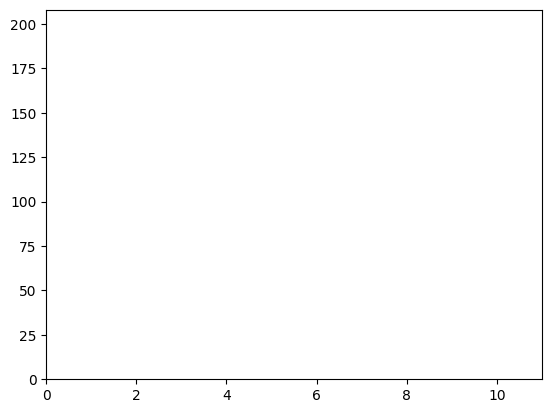

In [16]:
fig4, ax4 = plt.subplots()
ax4.set_xlim(0,M+1)
ax4.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

scale = 25

def frameline(i):
    ax4.clear()
    ax4.set_xlim(0,M+1)
    ax4.set_ylim(0,MAX)

    global u, v
    u = U[:, scale * i]
    v = V[:, scale * i]

    ax4.plot(sitios, u, color = "orange")
    ax4.plot(sitios, v, color = "purple")
    ax4.set_title("Distribución de población en sitios ("+str(i*scale)+"/"+str(n)+")")

    return fig4




In [17]:
ani = FuncAnimation(fig4, func = frameline, frames = n//(15*scale), repeat = False, interval = 0.01, save_count = 100)

/shared-libs/python3.9/py/lib/python3.9/site-packages/matplotlib/animation.py:879: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


In [18]:
if grafica:
    ani

En el siguiente ejemplo, se compararán para cada sitio, las curvas de población vs. tiempo para el proceso $(U(t), V(t))$ y el proceso reescalado $(U(M^2 t)/N, V(M^2 t)/ N)$

In [19]:
#población de u en el sitio i a tiempo t: XX[0, i, t]
#luego, haremos un for en t; y graficaremos XX[0,:,t] vs range(M)


#u1 = np.multiply([1,3,5,2], 1)
#v1 = np.multiply([0,9,2,5], 1)

#u2 = np.multiply([1,3,5,2,9,0,0,1,7,2], 10)
#v2 = np.multiply([0,9,2,5,1,10,10,9,3,8], 10)

u3 = np.multiply([8,3,1,3], 100)
v3 = np.multiply([3,1,3,8], 100)

N = sum(u3) + sum(v3) #asociado a u3 + v3
M = 4 #asociado a u3, v3
print("N = " + str(N))
print("M = " + str(M))

X, T, n = MarkovChain2(u3, v3, 1, a, d)
XX = X[:,:, 0:n]
TT = T[0:n]

ESC = 1/N * XX[:, :, 0:n]
TTESC = (M*M) * T[0:n]

M = len(u2)
sitios = np.array(range(M)) + 1


U = XX[0, :, :]
V = XX[1, :, :]

print(n)

N = 3000
M = 4
2363958


In [20]:
if grafica:
    for i in range(len(u1)):
        plt.plot(TT, XX[0, i], label = "sitio "+str(i))
        plt.title("Población u de estado inicial " + str(u3) )
        plt.legend()
    plt.show()

    for i in range(len(u1)):
        plt.plot(TTESC, ESC[0, i], label = "sitio "+str(i))
        plt.title("Población u de estado inicial " + str(u3) + " escalado." )
        plt.legend()
    plt.show()

In [21]:
if grafica:
    for i in range(len(u1)):
        plt.plot(TT, XX[1, i], label = "sitio "+str(i))
        plt.title("Población u de estado inicial " + str(v3) )
        plt.legend()
    plt.show()

    for i in range(len(u1)):
        plt.plot(TTESC, ESC[1, i], label = "sitio "+str(i))
        plt.title("Población v de estado inicial " + str(v3) + " escalado." )
        plt.legend()
    plt.show()

Ejemplo con $M = 10, N = 100000$ ($\frac{N}{M^2} = 1000$) (no corre ☺).

In [23]:
#población de u en el sitio i a tiempo t: XX[0, i, t]
#luego, haremos un for en t; y graficaremos XX[0,:,t] vs range(M)

u4 = np.multiply([1,1,1,1,1,1,1,1,1,1], 5000)
v4 = np.multiply([1,1,1,1,1,1,1,1,1,1], 5000)

N = np.sum(u4) + np.sum(v4)
M = len(u4)

# X, T, n = MarkovChain2(u4, v4, 1, a, d) Activar sólo si se quiere esperar 30 min

#cadenas normales
#XX = X[:,:, 0:n]
#TT = T[0:n]

#cadenas escaladas
#ESC = 1/N * XX[:, :, 0:n]
#TTESC = (M*M) * T[0:n]

#sitios = np.array(range(M)) + 1



In [24]:
#if grafica:
 #   for i in range(len(u4)):
  #      plt.plot(TT, XX[0, i], label = "sitio "+str(i))
   #     plt.title("Población u de estado inicial " + str(u4))
    #    plt.legend()
    #plt.show()

#    for i in range(len(u4)):
 #       plt.plot(TTESC, ESC[0, i], label = "sitio "+str(i))
  #      plt.title("Población u de estado inicial " + str(u4) )
   #     plt.legend()
    #plt.show()



## EJEMPLOS ILUSTRATIVOS

Vamos a implementar algunos ejemplos de condiciones iniciales de u y v para observar el comportamiento en función de los parámetros $a$ y $d$.

### AUTO-DIFUSIÓN


Experimentaremos la influencia del párámetro $d$ de autodifusión en el efecto de la dinámica del proceso. Usaremos $d_{control} = [1,1]$ como referencia, y $d_G = [4,1]$ y $d_C = [\frac14, 1]$ para explorar este efecto.

Primero, para evaluar el efecto de los coeficientes $d$ pondremos una condición inicial que separe las especies en dos sitios distintos y otra en que sólo exista una especie concentrada en un sitio.

Es de relevancia notar que fijamos $M = 10$, $N = 1000$, $a = [1,1]$, $T = 5$ y la semilla para obtener consistencia en los resultados. Variamos los parámetros iniciales $u_0, v_0$ para fijarnos en distintos tipos de interacción. 

In [25]:
#Caso especie concentrada en un sitio y la otra no existe
M = 10
T = 5
u0 = np.zeros(M)
u0[5] = 1000
v0 = np.zeros(M)

D = [[1,1], [4,1], [1/4, 1]]

d_control = D[0]
d_G = D[1]
d_C = D[2] 
a_control = [1,1]


Caso control:

In [26]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:, :, 0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [27]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig


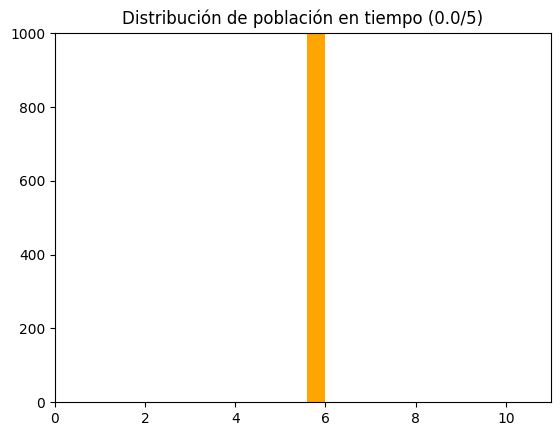

In [28]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(5*scale), repeat = False, interval = 0.01, save_count = 100)

In [29]:
if grafica:
    ani

Caso $d_G$

In [30]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_G, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:, :, 0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [31]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

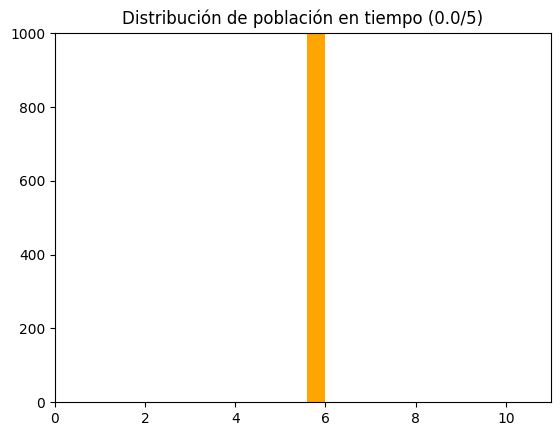

In [32]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(5*scale), repeat = False, interval = 0.01, save_count = 100)

In [33]:
if grafica:
    ani

Caso $d_C$

In [34]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_C, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:, :, 0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [35]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

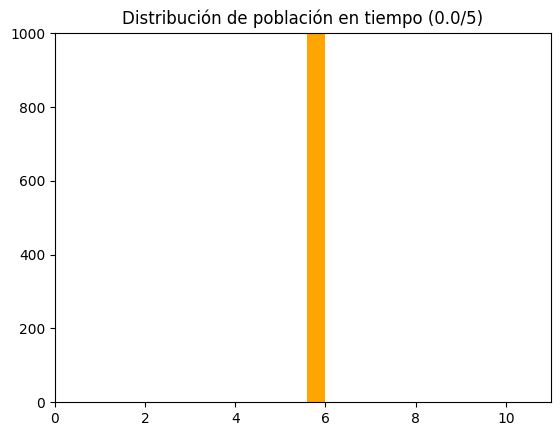

In [36]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(5*scale), repeat = False, interval = 0.01, save_count = 100)

In [37]:
if grafica:
    ani

Ahora veremos los mismos $d$ para el caso donde las especies están separadas y concentradas. La conducta esperada es que cada una tienda a actuar de manera independiente hasta que se topen en los sitios.

Para $d_{control}$

In [38]:
#Caso especies concentradas en sitios distintos

M = 10
T = 5

u0 = np.zeros(M)
u0[4] = 500
v0 = np.zeros(M)
v0[M-1] = 500

In [48]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [49]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig


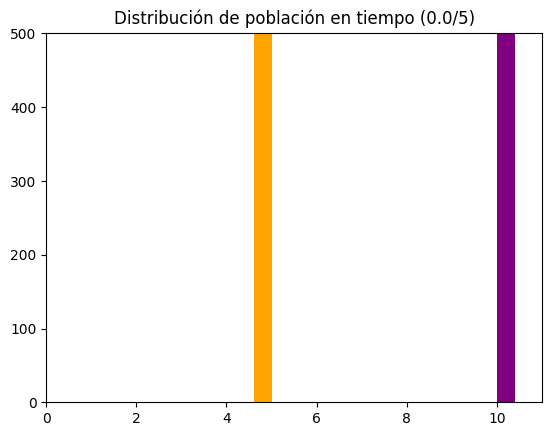

In [50]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [51]:
if grafica:
    ani

Para $d_G$

In [52]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_G, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [53]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig


/shared-libs/python3.9/py/lib/python3.9/site-packages/matplotlib/animation.py:879: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


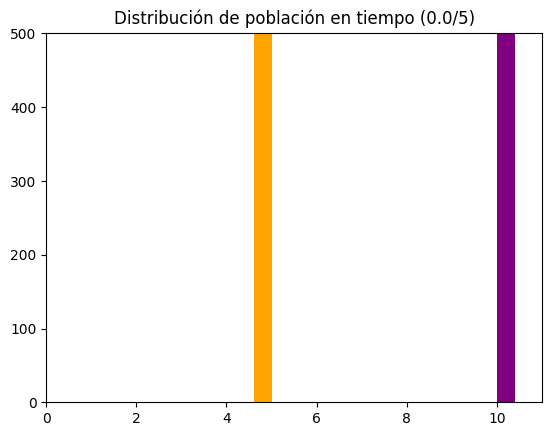

In [54]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [55]:
if grafica:
    ani

Para $d_C$

In [56]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_C, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [57]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

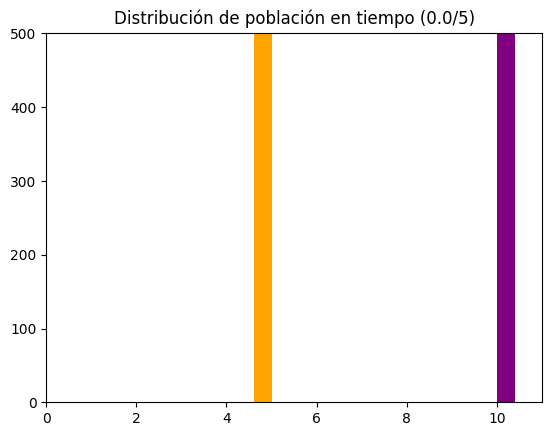

In [58]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [59]:
if grafica:
    ani

### DIFUSIÓN CRUZADA

Ahora para el caso de difusión cruzada, queremos ver la incidencia que tienen los coeficientes $a_{ij}$. Para esto, simularemos varios casos de condición inicial con diferentes valores de $a_{ij}$, pero fijando los valores de $M, T, N$ y $d$ como sigue:

- $M = 10$
- $T = 5$
- $N = 1000$
- $d = [1,1]$

Los valores a simular de $a_{ij}$ serán $a_{control} = [1,1]$, $a_{G} = [4,1]$ y $a_{C} = [1/4,1]$.

 Para esto, usaremos primero una condición inicial con todos los individuos (de ambas especies) en un mismo sitio.

In [60]:
#Caso especies concentradas en un mismo sitio

M = 10
T = 5

u0 = np.zeros(M)
u0[4] = 500
v0 = np.zeros(M)
v0[4] = 500


A = [[1,1], [4,1], [1/4, 1]]
a_control = A[0]
a_G = A[1]
a_C = A[2]
d_control = [1,1]

Para $a_{control}$

In [61]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [62]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

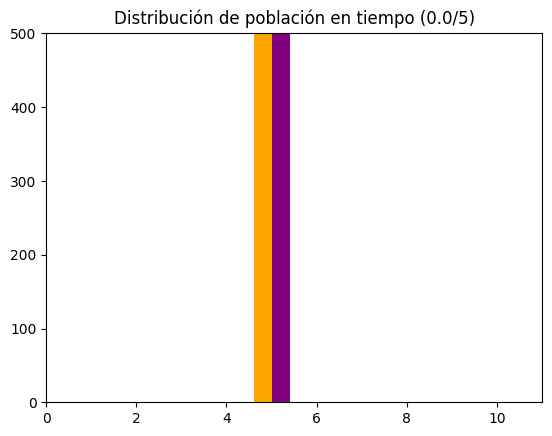

In [63]:
ploMAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [64]:
if grafica:
    ani

Para $a_G$

In [65]:
XX, tt, n = MarkovChain2(u0,v0,T, a_G, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [66]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

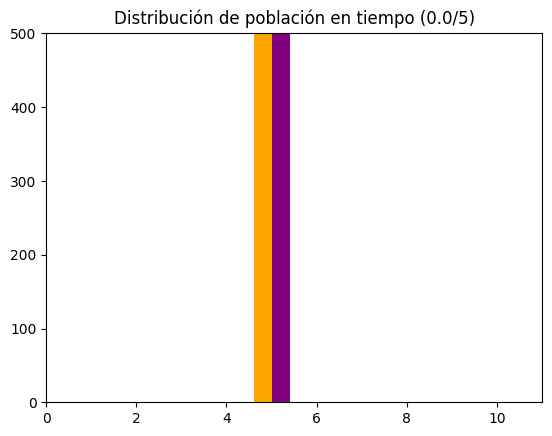

In [67]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [68]:
if grafica:
    ani

Para $a_C$

In [69]:
XX, tt, n = MarkovChain2(u0,v0,T, a_C, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [70]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

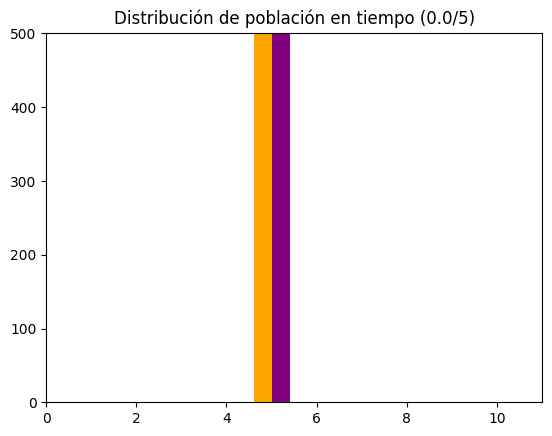

In [71]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [72]:
if grafica:
    ani

Luego, haremos el caso uniforme (todos los sitios con la misma cantidad de ambas especies)

In [73]:
#Caso especies uniformemente distribuidas

M = 10
T = 5

u0 = np.ones(M)
u0[:] = u0[:]*50
v0 = np.ones(M)
v0[:] = v0[:]*50

Para $a_{control}$

In [74]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [75]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

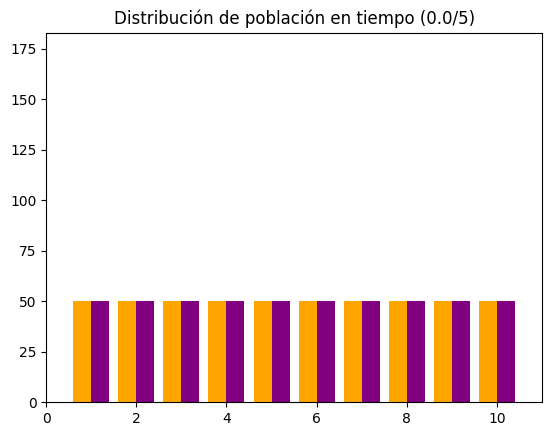

In [76]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [77]:
if grafica:
    ani

Para $a_G$

In [78]:
XX, tt, n = MarkovChain2(u0,v0,T, a_G, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [79]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

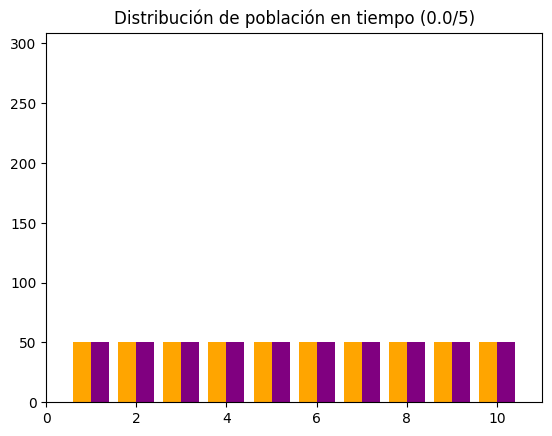

In [80]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [81]:
if grafica:
    ani

Para $a_C$

In [82]:
XX, tt, n = MarkovChain2(u0,v0,T, a_C, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [83]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

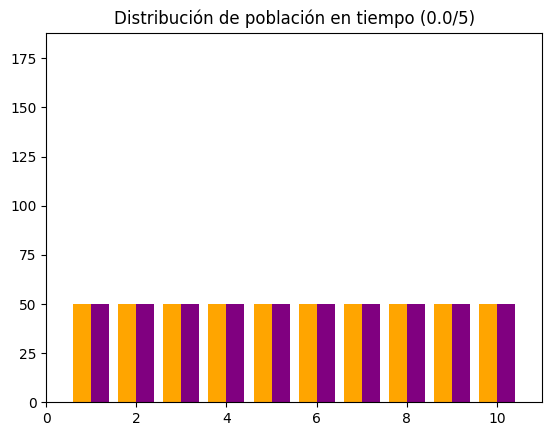

In [84]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [85]:
if grafica:
    ani

Por último verificaremos si, partiendo de sitios alejados, los tres gráficos no varían demasiado dado que los coeficientes de autodifusión son ctes en los tres.

In [86]:
#Caso especies alejadas

M = 10
T = 5

u0 = np.zeros(M)
u0[4] = 500
v0 = np.zeros(M)
v0[M-1] = 500

Para $a_{control}$

In [87]:
XX, tt, n = MarkovChain2(u0,v0,T, a_control, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [88]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

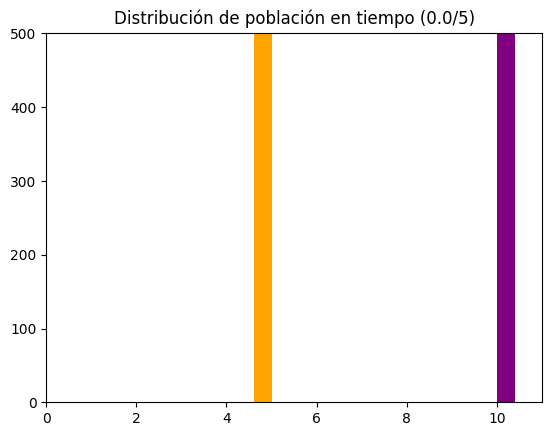

In [89]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [ ]:
if grafica:
    ani

Para $a_G$

In [ ]:
XX, tt, n = MarkovChain2(u0,v0,T, a_G, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [ ]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

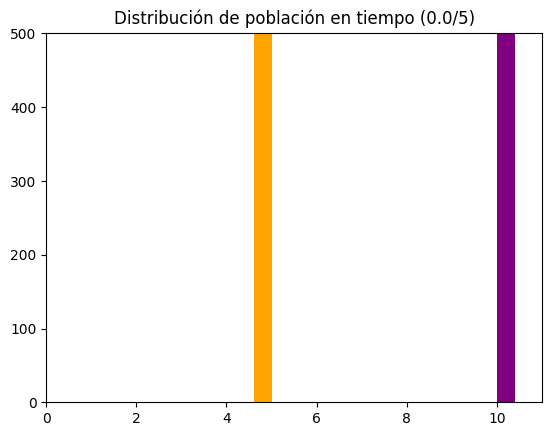

In [ ]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [ ]:
if grafica:
    ani

Para $a_C$

In [ ]:
XX, tt, n = MarkovChain2(u0,v0,T, a_C, d_control, semilla = 0)
sitios = np.array(range(M)) + 1
XX = XX[:,:,0:n]
tt = tt[0:n]

U = XX[0, :, :]
V = XX[1, :, :]

In [ ]:
scale = 25

def framebar(i):
    ax.clear()
    ax.set_xlim(0,M+1)
    ax.set_ylim(0,MAX)

    global u, v
    u = U[:, scale*i]
    v = V[:, scale*i]

    ax.bar(sitios-0.2, u, width = 0.4, color = "orange")
    ax.bar(sitios+0.2, v, width = 0.4, color = "purple")
    ax.set_title("Distribución de población en tiempo ("+str(round(tt[scale*i],4))+"/"+str(T)+")")

    #ax.plot(sitios, u, color = "orange")
    #ax.plot(sitios, v, color = "purple")

    return fig

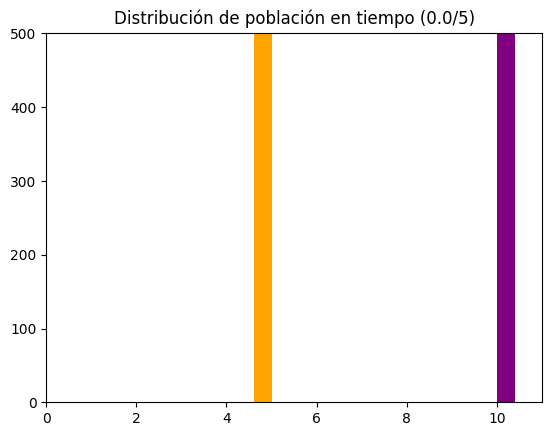

In [ ]:
MAX= np.max(XX)+1
fig, ax = plt.subplots()
ax.set_xlim(0,M+1)
ax.set_ylim(0,MAX)
u  = U[:, 0]
v =  V[:, 0]

ani = FuncAnimation(fig, func = framebar, frames = n//(100*scale), repeat = False, interval = 0.01, save_count = 100)

In [ ]:
if grafica:
    ani

test

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=56289946-015c-4d9e-9fa4-7fbfa726301f' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>